## Libraries & Modules

In [1]:
import os
import glob
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import tensorflow.keras as keras
import tensorflow as tf

In [3]:

print(tf.__version__)

2.17.0


In [39]:
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Flatten
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Activation,AveragePooling2D,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## Data

In [5]:
train_dir = r"C:\Users\kiran\Downloads\Plant-Disease-Identifier-main\Plant-Disease-Identifier-main\dataset\Train"
test_dir = r"C:\Users\kiran\Downloads\Plant-Disease-Identifier-main\Plant-Disease-Identifier-main\dataset\Test"
valid_dir = r"C:\Users\kiran\Downloads\Plant-Disease-Identifier-main\Plant-Disease-Identifier-main\dataset\val"


## Preprocessing

In [6]:
def get_files(directory):
  if not os.path.exists(directory):
    return 0
  count=0
  for current_path,dirs,files in os.walk(directory):
    for dr in dirs:
      count+= len(glob.glob(os.path.join(current_path,dr+"/*")))
  return count

In [7]:
train_samples = get_files(train_dir)
num_classes_train = len(glob.glob(train_dir+"/*"))

# test_samples=get_files(test_dir)
# num_classes_test = len(glob.glob(test_dir+"/*"))

valid_samples=get_files(valid_dir)
num_classes_valid = len(glob.glob(valid_dir+"/*"))

print(num_classes_train,"Classes")
print(train_samples,"Train images")

# print(num_classes_test, "Classes")
# print(test_samples,"Test images")

print(num_classes_valid, "Classes")
print(valid_samples,"Valid images")

38 Classes
62986 Train images
36 Classes
37187 Valid images


In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen=ImageDataGenerator(rescale=1./255,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale = 1./255)

In [9]:
img_width,img_height =256,256

input_shape=(img_width,img_height,3)

batch_size =64

train_generator =train_datagen.flow_from_directory(train_dir, target_size=(img_width,img_height), batch_size=batch_size)

valid_generator = valid_datagen.flow_from_directory(valid_dir, target_size=(img_width, img_height), batch_size=batch_size)

# test_generator=test_datagen.flow_from_directory(test_dir,shuffle=True,target_size=(img_width,img_height), batch_size=batch_size)

Found 62985 images belonging to 38 classes.
Found 37186 images belonging to 36 classes.


In [10]:
train_generator.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper__bell___Bacterial_spot': 18,
 'Pepper__bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato_Bacterial_spot': 28,
 'Tomato_Early_blight': 29,
 'Tomato_L

In [11]:
valid_generator.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Pepper__bell___Bacterial_spot': 16,
 'Pepper__bell___healthy': 17,
 'Potato___Early_blight': 18,
 'Potato___Late_blight': 19,
 'Potato___healthy': 20,
 'Raspberry___healthy': 21,
 'Soybean___healthy': 22,
 'Squash___Powdery_mildew': 23,
 'Strawberry___Leaf_scorch': 24,
 'Strawberry___healthy': 25,
 'Tomato_Bacterial_spot': 26,
 'Tomato_Early_blight': 27,
 'Tomato_Late_blight': 28,
 'Tomato_Leaf_Mold': 29,
 'Tomato_Sept

In [12]:
def printData(generator):
    print("Samples:",generator.samples)
    print("No of classes:",generator.num_classes)
    print("Batch size:", generator.batch_size)
    print("Data format:", generator.dtype)
    print("Color mode:",generator.color_mode)
    print("Image shape:", generator.image_shape)
    print("Allowed class modes:", generator.allowed_class_modes)
    print("Class Mode:", generator.class_mode)
    

In [13]:
printData(train_generator)

Samples: 62985
No of classes: 38
Batch size: 64
Data format: float32
Color mode: rgb
Image shape: (256, 256, 3)
Allowed class modes: {None, 'binary', 'sparse', 'categorical', 'input'}
Class Mode: categorical


In [14]:
printData(valid_generator)

Samples: 37186
No of classes: 36
Batch size: 64
Data format: float32
Color mode: rgb
Image shape: (256, 256, 3)
Allowed class modes: {None, 'binary', 'sparse', 'categorical', 'input'}
Class Mode: categorical


In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Flatten
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Activation,AveragePooling2D,BatchNormalization

## First Model

In [17]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import numpy as np

model = Sequential([
    Conv2D(50, kernel_size=(3, 3), input_shape=(256, 256, 3), name='conv2d_1'),
    MaxPooling2D(pool_size=(2, 2), name='max_pooling2d_1'),
    Conv2D(30, kernel_size=(3, 3), name='conv2d_2'),
    MaxPooling2D(pool_size=(2, 2), name='max_pooling2d_2'),
    Conv2D(20, kernel_size=(3, 3), name='conv2d_3'),
    MaxPooling2D(pool_size=(2, 2), name='max_pooling2d_3'),
    Flatten(name='flatten'),
    Dense(30, activation='relu'),
    Dense(2, activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Build the model with dummy data to initialize layers
dummy_input = np.random.random((1, 256, 256, 3))
model.build((None, 256, 256, 3))  # Explicitly build the model
model.summary()  # Print model summary to verify layer names


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 254, 254, 50)   │         1,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 127, 127, 50)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 125, 125, 30)   │        13,530 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 62, 62, 30)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 60, 60, 20)     │         5,420 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 30, 30, 20)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 30)             │       540,030 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │            62 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 560,442 (2.14 MB)

 Trainable params: 560,442 (2.14 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [19]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 254, 254, 50)   │         1,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 127, 127, 50)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 125, 125, 30)   │        13,530 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 62, 62, 30)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 60, 60, 20)     │         5,420 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 30, 30, 20)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 30)             │       540,030 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │            62 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 560,442 (2.14 MB)

 Trainable params: 560,442 (2.14 MB)

 Non-trainable params: 0 (0.00 B)

In [20]:
model_layers = [ layer.name for layer in model.layers]
print('layer name : ',model_layers)

layer name :  ['conv2d_1', 'max_pooling2d_1', 'conv2d_2', 'max_pooling2d_2', 'conv2d_3', 'max_pooling2d_3', 'flatten', 'dense_2', 'dense_3']


In [21]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [22]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 254, 254, 50)   │         1,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 127, 127, 50)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 125, 125, 30)   │        13,530 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 62, 62, 30)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 60, 60, 20)     │         5,420 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 30, 30, 20)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 30)             │       540,030 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │            62 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 560,442 (2.14 MB)

 Trainable params: 560,442 (2.14 MB)

 Non-trainable params: 0 (0.00 B)

In [23]:
model_layers = [ layer.name for layer in model.layers]
print('layer name : ',model_layers)

layer name :  ['conv2d_1', 'max_pooling2d_1', 'conv2d_2', 'max_pooling2d_2', 'conv2d_3', 'max_pooling2d_3', 'flatten', 'dense_2', 'dense_3']


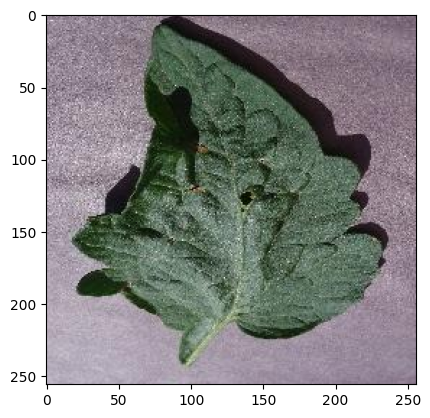

In [24]:
from keras.preprocessing import image
import numpy as np

img_path = r"C:\Users\kiran\Downloads\Plant-Disease-Identifier-main\Plant-Disease-Identifier-main\dataset\Train\Tomato__Target_Spot\0a2de4c5-d688-4f9d-9107-ace1d281c307___Com.G_TgS_FL 7941.JPG"

img1 = image.load_img(img_path)
plt.imshow(img1);
#preprocess image
img1 = image.load_img(img_path, target_size=(256, 256))
img = image.img_to_array(img1)
img = img/255
img = np.expand_dims(img, axis=0)

In [25]:
import keras
print("Keras version:", keras.__version__)


Keras version: 3.5.0


In [26]:
import keras
print("Keras version:", keras.__version__)


Keras version: 3.5.0


In [28]:
for layer in model.layers:
    print(layer.name)


conv2d_1
max_pooling2d_1
conv2d_2
max_pooling2d_2
conv2d_3
max_pooling2d_3
flatten
dense_2
dense_3


In [29]:
model(np.random.random((1, 256, 256, 3)))  # Perform a forward pass


<tf.Tensor: shape=(1, 2), dtype=float32, numpy=array([[0.497172, 0.502828]], dtype=float32)>

In [35]:
conv2d_0_layer = model.layers[0]  # Replace 0 with the appropriate index


In [36]:
for layer in model.layers:
    print(layer.name)


conv2d_1
max_pooling2d_1
conv2d_2
max_pooling2d_2
flatten
output


In [46]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten

# Define the input shape
input_shape = (256, 256, 3)

# Create a dummy input
input_layer = Input(shape=input_shape)

# Define the model architecture
x = Conv2D(32, (3, 3), activation='relu')(input_layer)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)

# Create the model
model = Model(inputs=input_layer, outputs=x)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define models for extracting intermediate outputs
conv2d_0_output = Model(inputs=model.input, outputs=model.get_layer('conv2d').output)
max_pooling2d_0_output = Model(inputs=model.input, outputs=model.get_layer('max_pooling2d').output)
conv2d_1_output = Model(inputs=model.input, outputs=model.get_layer('conv2d_1').output)
max_pooling2d_1_output = Model(inputs=model.input, outputs=model.get_layer('max_pooling2d_1').output)
conv2d_2_output = Model(inputs=model.input, outputs=model.get_layer('conv2d_2').output)
max_pooling2d_2_output = Model(inputs=model.input, outputs=model.get_layer('max_pooling2d_2').output)
flatten_1_output = Model(inputs=model.input, outputs=model.get_layer('flatten').output)

# Prepare a dummy image input
img = np.random.random((1, 256, 256, 3))

# Get intermediate outputs
conv2d_0_features = conv2d_0_output.predict(img)
max_pooling2d_0_features = max_pooling2d_0_output.predict(img)
conv2d_1_features = conv2d_1_output.predict(img)
max_pooling2d_1_features = max_pooling2d_1_output.predict(img)
conv2d_2_features = conv2d_2_output.predict(img)
max_pooling2d_2_features = max_pooling2d_2_output.predict(img)
flatten_1_features = flatten_1_output.predict(img)

print("Intermediate outputs obtained successfully.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Intermediate outputs obtained successfully.


In [47]:
import matplotlib.image as mpimg

# function to plot images after each layer

def plot_images(img_width, img_height, rows, columns, layer):
    fig=plt.figure(figsize=(img_width,img_height))
    columns = columns
    rows = rows
    for i in range(columns*rows):
        fig.add_subplot(rows, columns, i+1)
        plt.axis('off')
        plt.title('filter'+str(i))
        plt.imshow(layer[0, :, :, i], cmap='viridis') # Visualizing in color mode.
    plt.show()

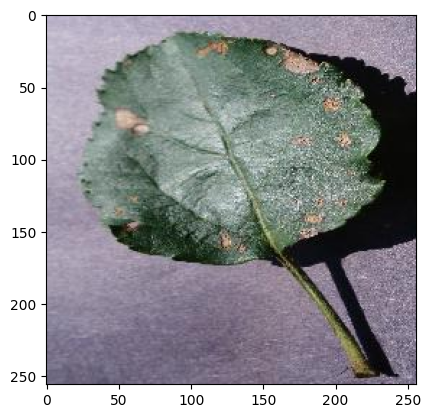

In [48]:
from keras.preprocessing import image
import numpy as np

img_path = r"C:\Users\kiran\Downloads\Plant-Disease-Identifier-main\Plant-Disease-Identifier-main\dataset\Train\Apple___Black_rot\0b8dabb7-5f1b-4fdc-b3fa-30b289707b90___JR_FrgE.S 3047.JPG"

img1 = image.load_img(img_path)
plt.imshow(img1);
#preprocess image
img1 = image.load_img(img_path, target_size=(256, 256))
img = image.img_to_array(img1)
img = img/255
img = np.expand_dims(img, axis=0)

### Plotting images after every layer for first model

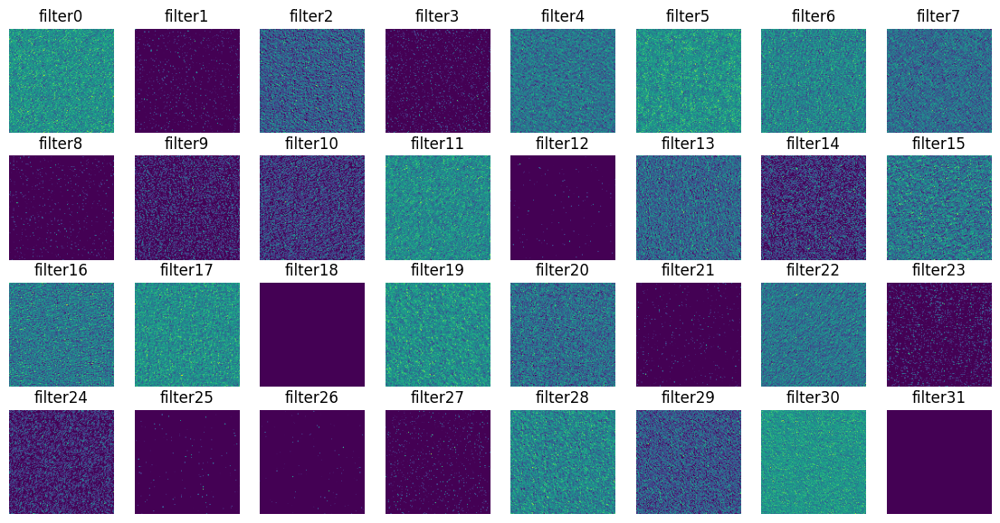

In [49]:
## conv2d_0_features

img_width = 14
img_height = 7

columns = 8
rows = 4

layer = conv2d_1_features

plot_images(img_width, img_height, rows, columns, layer)

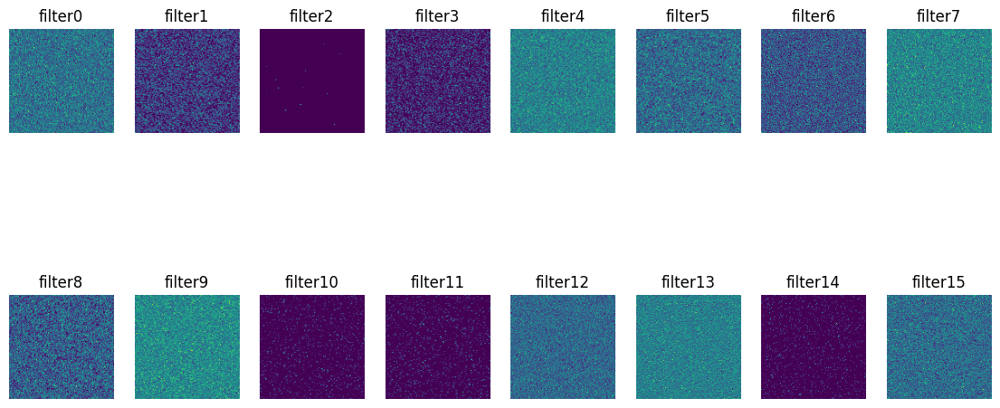

In [50]:
## max_pooling2d_0_features

img_width = 14
img_height = 7

columns = 8
rows = 2

layer = max_pooling2d_0_features

plot_images(img_width, img_height, rows, columns, layer)

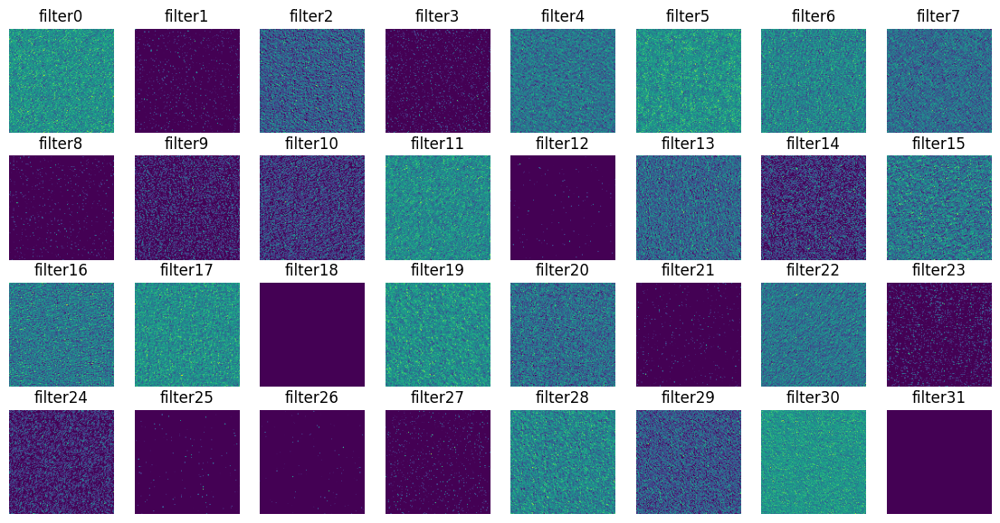

In [51]:
## conv2d_1_features

img_width = 14
img_height = 7

columns = 8
rows = 4

layer = conv2d_1_features

plot_images(img_width, img_height, rows, columns, layer)

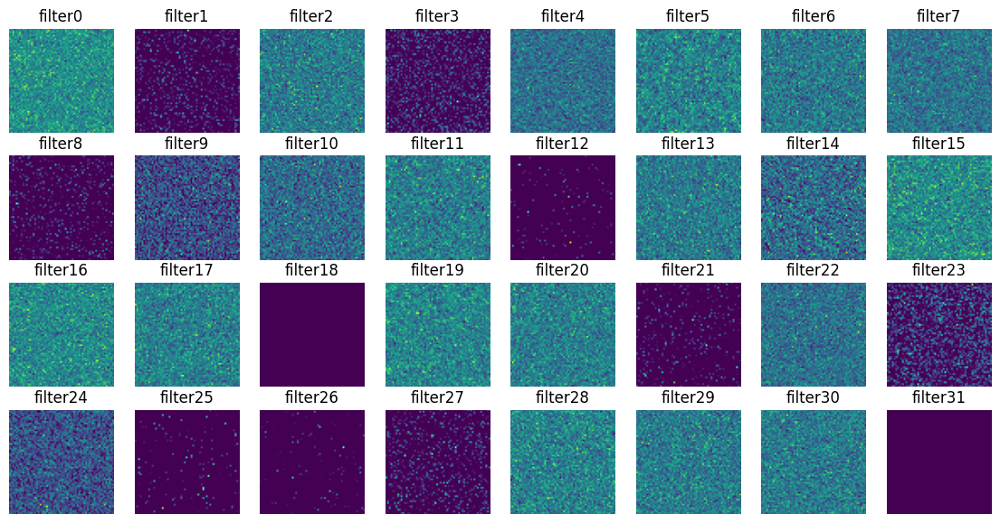

In [52]:
## max_pooling2d_1_features

img_width = 14
img_height = 7

columns = 8
rows = 4

layer = max_pooling2d_1_features

plot_images(img_width, img_height, rows, columns, layer)

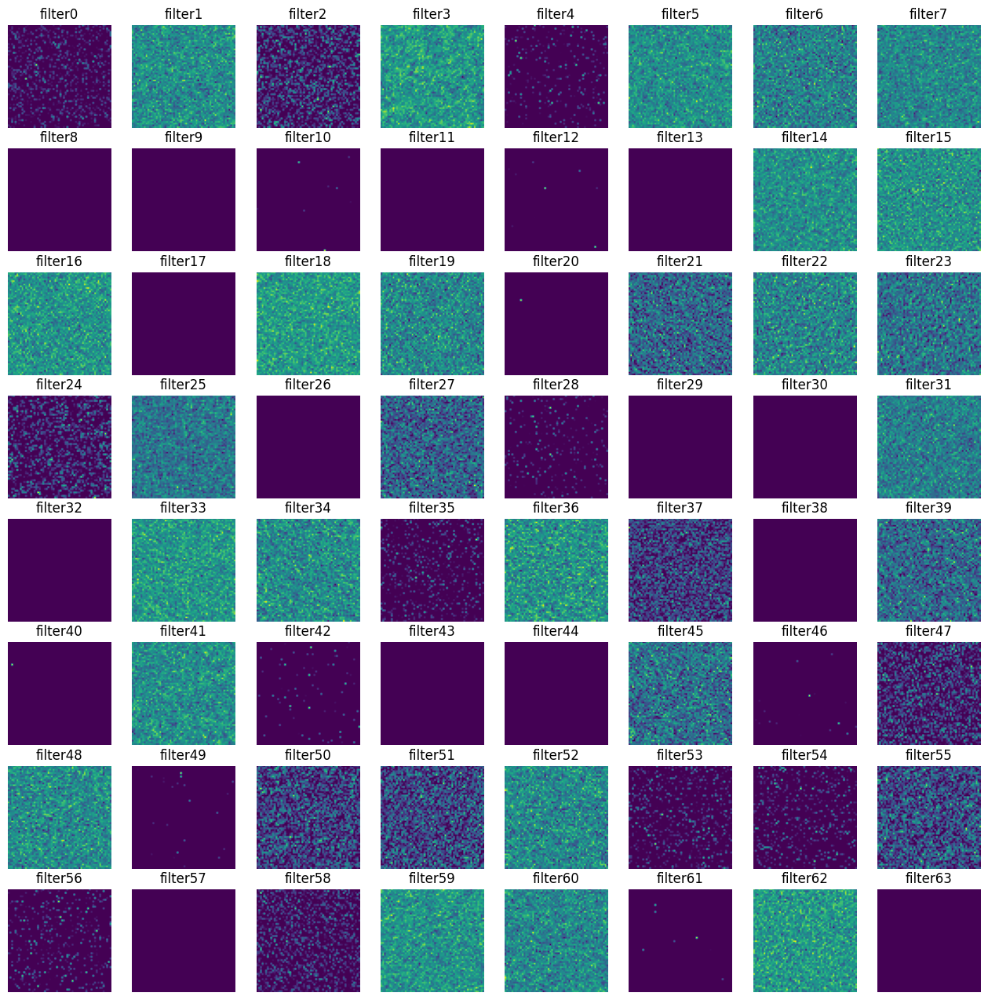

In [53]:
## conv2d_2_features

img_width = 16
img_height = 16

columns = 8
rows = 8

layer = conv2d_2_features

plot_images(img_width, img_height, rows, columns, layer)


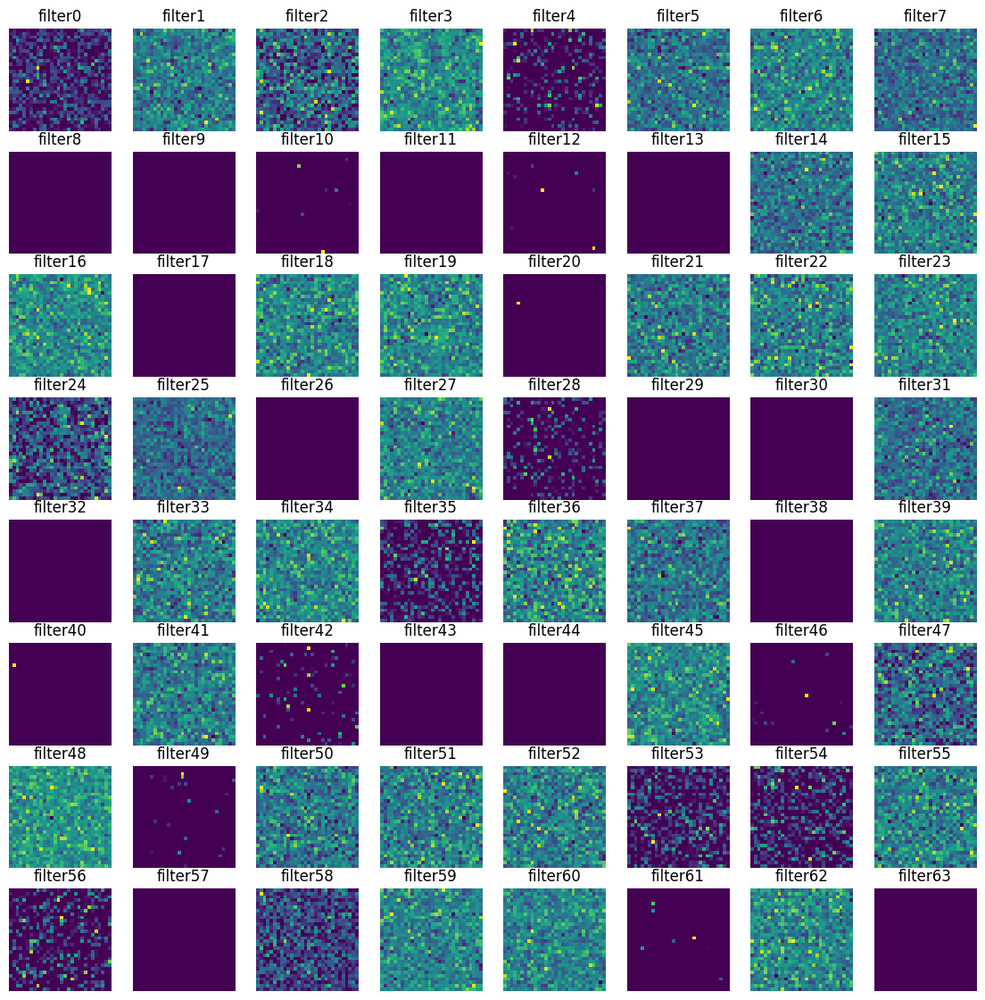

In [54]:
## max_pooling2d_2_features

img_width = 14
img_height = 14

columns = 8
rows = 8

layer = max_pooling2d_2_features

plot_images(img_width, img_height, rows, columns, layer)

## Second Model

In [55]:
## Second model

model = Sequential()

model.add(Conv2D(16, (5, 5), input_shape=input_shape,activation='relu'))
model.add(MaxPooling2D(pool_size=(3, 3)))

model.add(Conv2D(32, (3, 3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3),activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))   

model.add(Flatten())

model.add(Dense(256,activation='relu'))

model.add(Dropout(0.125))

model.add(Dense(128,activation='relu'))  

model.add(Dense(num_classes_train,activation='softmax'))

c:\Users\kiran\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [56]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [57]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 252, 252, 16)   │         1,216 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 84, 84, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 82, 82, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 41, 41, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 39, 39, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 19, 19, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 23104)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │     5,914,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 38)             │         4,902 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,977,030 (22.80 MB)

 Trainable params: 5,977,030 (22.80 MB)

 Non-trainable params: 0 (0.00 B)

In [62]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3), name='conv2d_1'))
model.add(MaxPooling2D((2, 2), name='max_pooling2d_1'))
model.add(Conv2D(64, (3, 3), activation='relu', name='conv2d_2'))
model.add(MaxPooling2D((2, 2), name='max_pooling2d_2'))
model.add(Conv2D(128, (3, 3), activation='relu', name='conv2d_3'))
model.add(MaxPooling2D((2, 2), name='max_pooling2d_3'))
model.add(Flatten(name='flatten_1'))

In [70]:
# Define the input shape
input_shape = (224, 224, 3)

# Define the model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape, name='conv2d_1'),
    MaxPooling2D((2, 2), name='max_pooling2d_1'),
    Conv2D(64, (3, 3), activation='relu', name='conv2d_2'),
    MaxPooling2D((2, 2), name='max_pooling2d_2'),
    Conv2D(128, (3, 3), activation='relu', name='conv2d_3'),
    MaxPooling2D((2, 2), name='max_pooling2d_3'),
    Flatten(name='flatten_1')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Build the model
model.build(input_shape=(None, 224, 224, 3))

# Create an input tensor
input_tensor = Input(shape=(224, 224, 3))

# Define models for extracting intermediate outputs
conv2d_0_output = Model(inputs=input_tensor, outputs=model.get_layer('conv2d_1')(input_tensor))
max_pooling2d_0_output = Model(inputs=input_tensor, outputs=model.get_layer('max_pooling2d_1')(conv2d_0_output.output))
conv2d_1_output = Model(inputs=input_tensor, outputs=model.get_layer('conv2d_2')(max_pooling2d_0_output.output))
max_pooling2d_1_output = Model(inputs=input_tensor, outputs=model.get_layer('max_pooling2d_2')(conv2d_1_output.output))
conv2d_2_output = Model(inputs=input_tensor, outputs=model.get_layer('conv2d_3')(max_pooling2d_1_output.output))
max_pooling2d_2_output = Model(inputs=input_tensor, outputs=model.get_layer('max_pooling2d_3')(conv2d_2_output.output))
flatten_1_output = Model(inputs=input_tensor, outputs=model.get_layer('flatten_1')(max_pooling2d_2_output.output))

# Prepare a dummy image input
img = np.random.random((1, 224, 224, 3))

# Get intermediate outputs
conv2d_0_features = conv2d_0_output.predict(img)
max_pooling2d_0_features = max_pooling2d_0_output.predict(img)
conv2d_1_features = conv2d_1_output.predict(img)
max_pooling2d_1_features = max_pooling2d_1_output.predict(img)
conv2d_2_features = conv2d_2_output.predict(img)
max_pooling2d_2_features = max_pooling2d_2_output.predict(img)
flatten_1_features = flatten_1_output.predict(img)

print("Intermediate outputs obtained successfully.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
Intermediate outputs obtained successfully.


### Plotting images after every layer for second model/

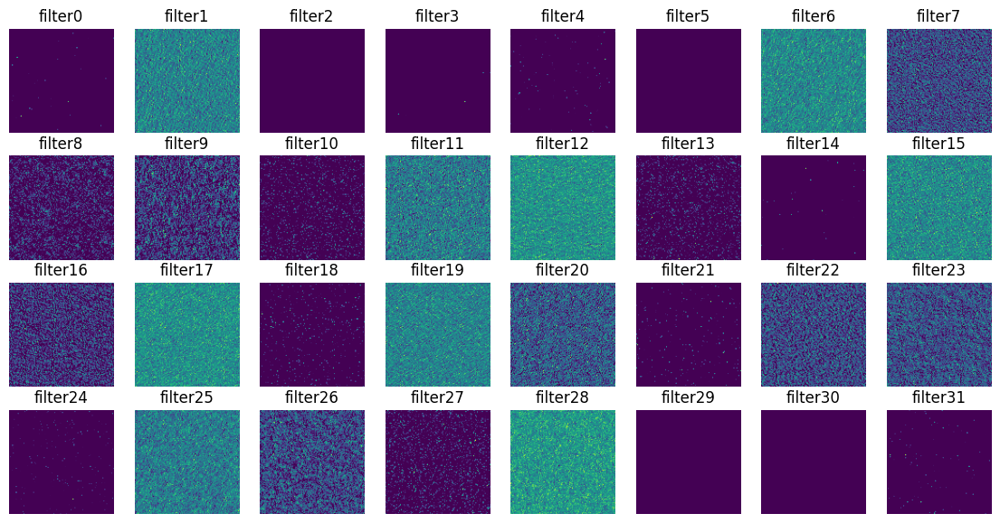

In [71]:
## conv2d_0_features

img_width = 14
img_height = 7

columns = 8
rows = 4

layer = conv2d_1_features

plot_images(img_width, img_height, rows, columns, layer)

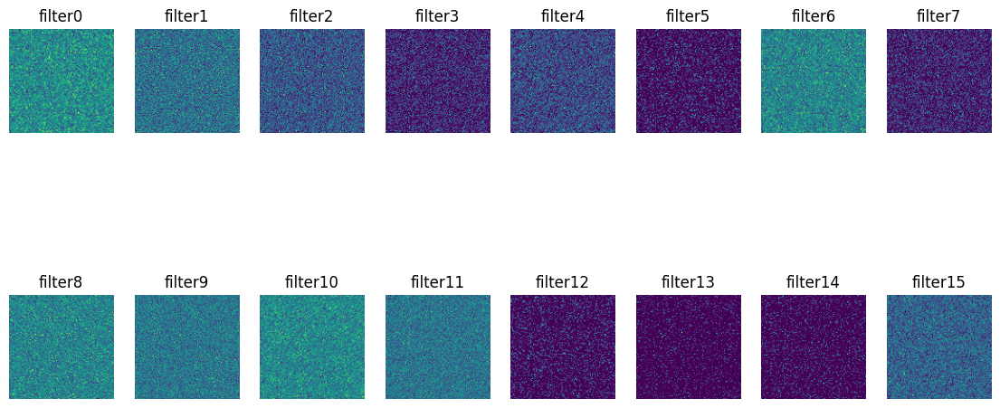

In [72]:
## max_pooling2d_0_features

img_width = 14
img_height = 7

columns = 8
rows = 2

layer = max_pooling2d_0_features

plot_images(img_width, img_height, rows, columns, layer)

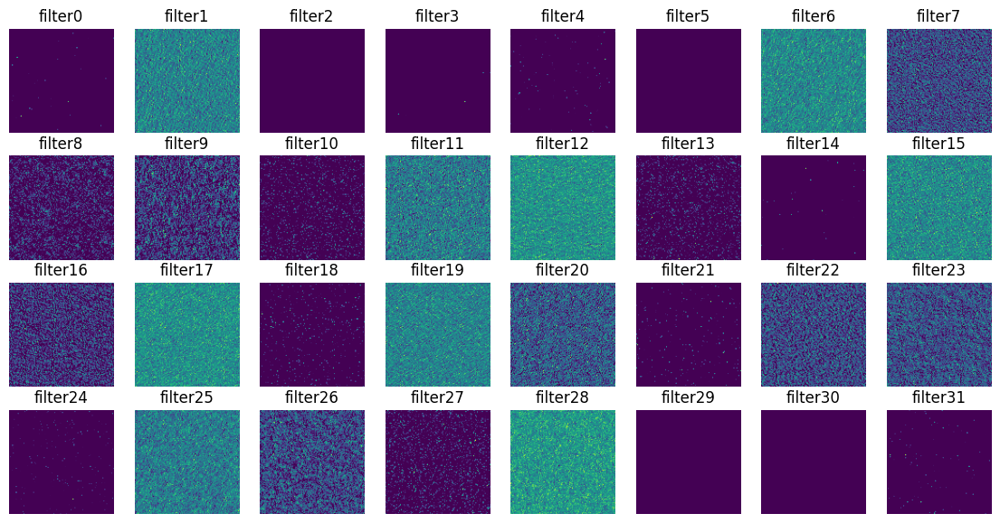

In [73]:
## conv2d_1_features

img_width = 14
img_height = 7

columns = 8
rows = 4

layer = conv2d_1_features

plot_images(img_width, img_height, rows, columns, layer)

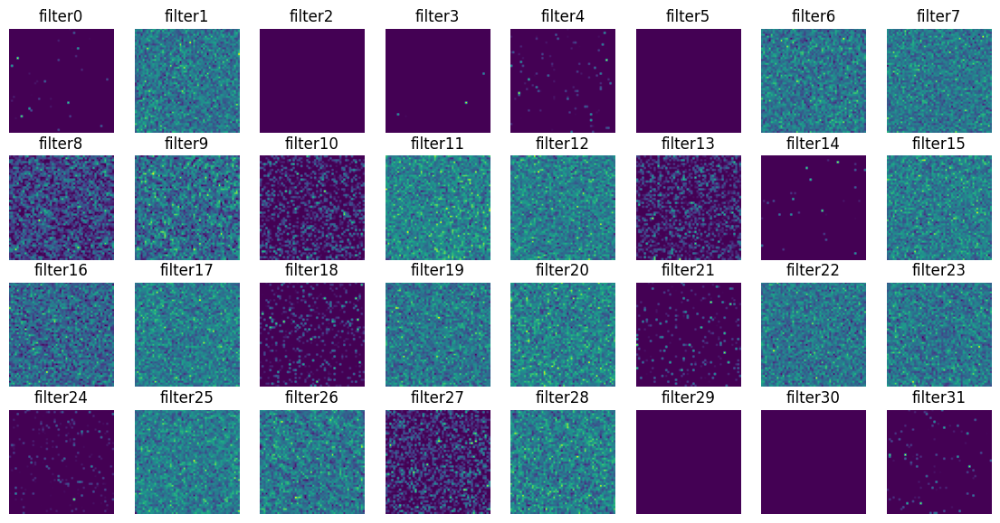

In [74]:
## max_pooling2d_1_features

img_width = 14
img_height = 7

columns = 8
rows = 4

layer = max_pooling2d_1_features

plot_images(img_width, img_height, rows, columns, layer)

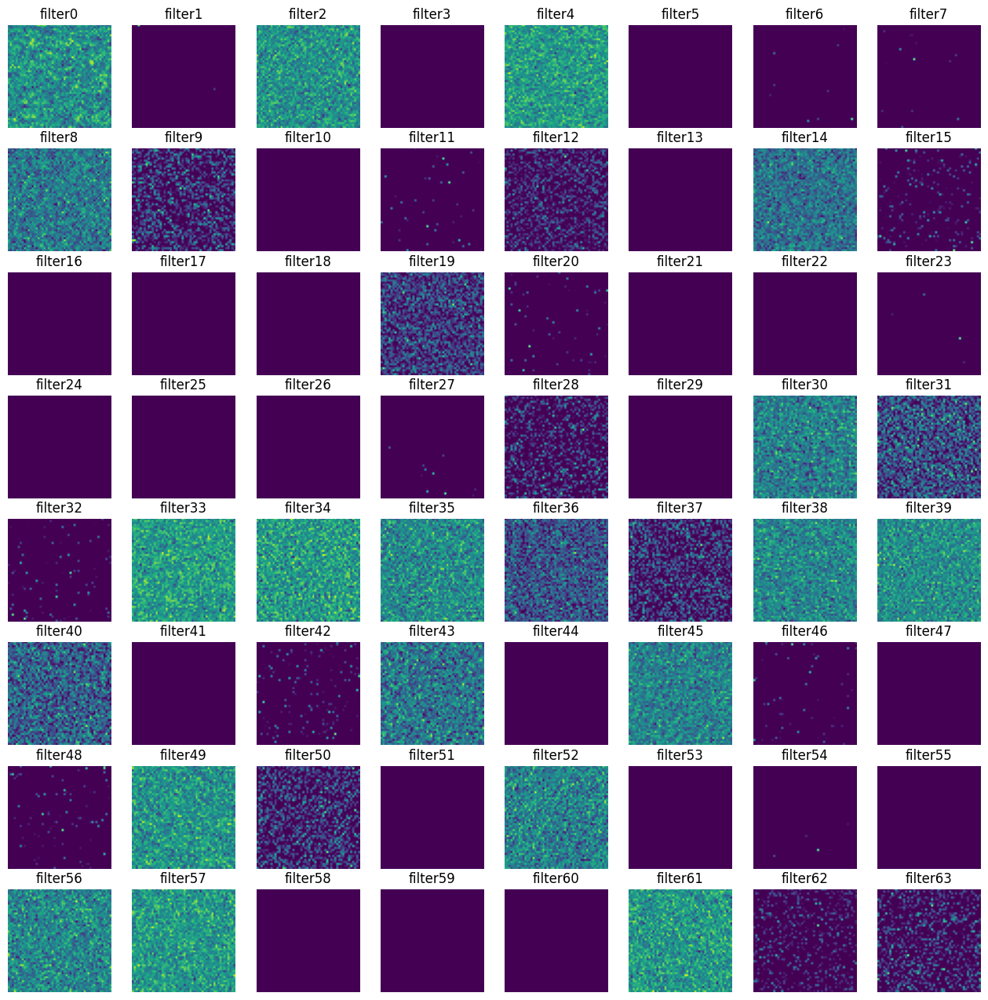

In [75]:
## conv2d_2_features

img_width = 16
img_height = 16

columns = 8
rows = 8

layer = conv2d_2_features

plot_images(img_width, img_height, rows, columns, layer)


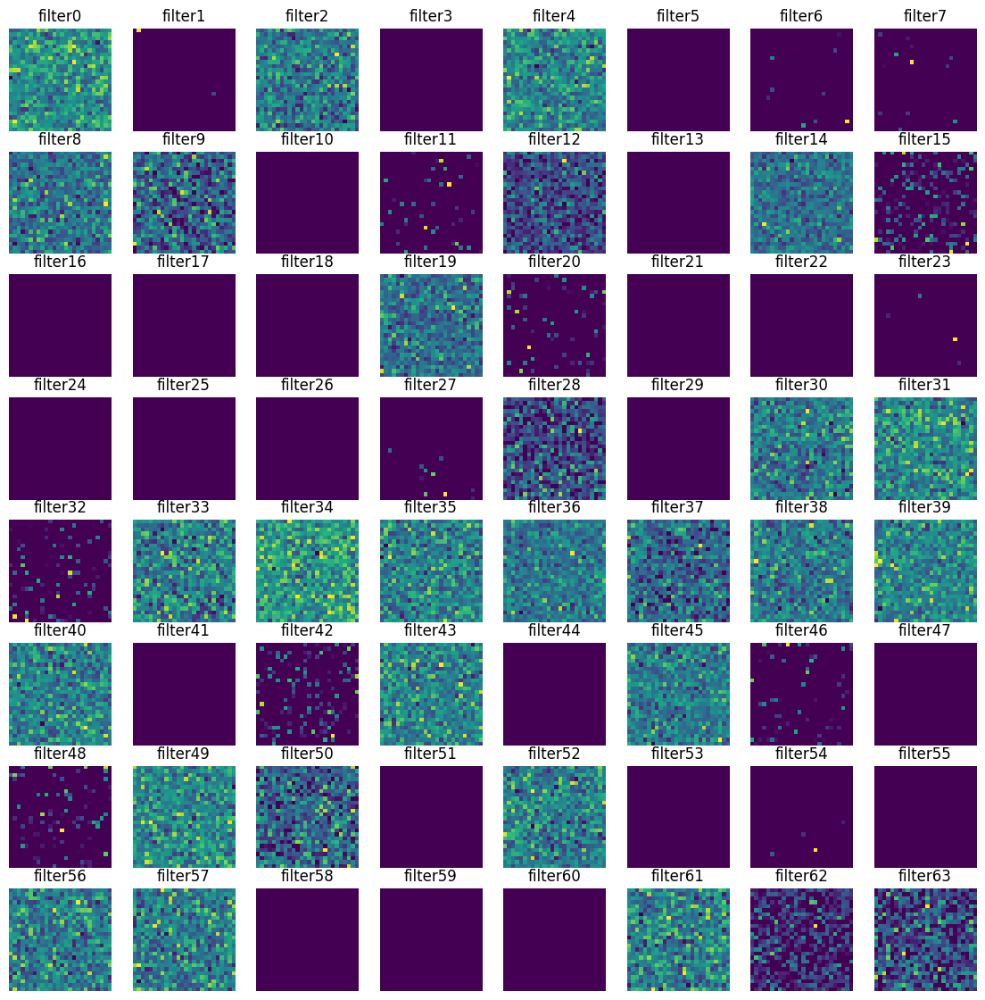

In [76]:
## max_pooling2d_2_features

img_width = 14
img_height = 14

columns = 8
rows = 8

layer = max_pooling2d_2_features

plot_images(img_width, img_height, rows, columns, layer)

In [77]:
model.save("plant_detection.h5")